In [223]:
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import display, Image
import numpy as np
from matplotlib import pyplot as plt
image_file= "/content/450898690_1133114441093001_9188723279379579781_n.jpg"
img= cv2.imread(image_file,cv2.IMREAD_GRAYSCALE)

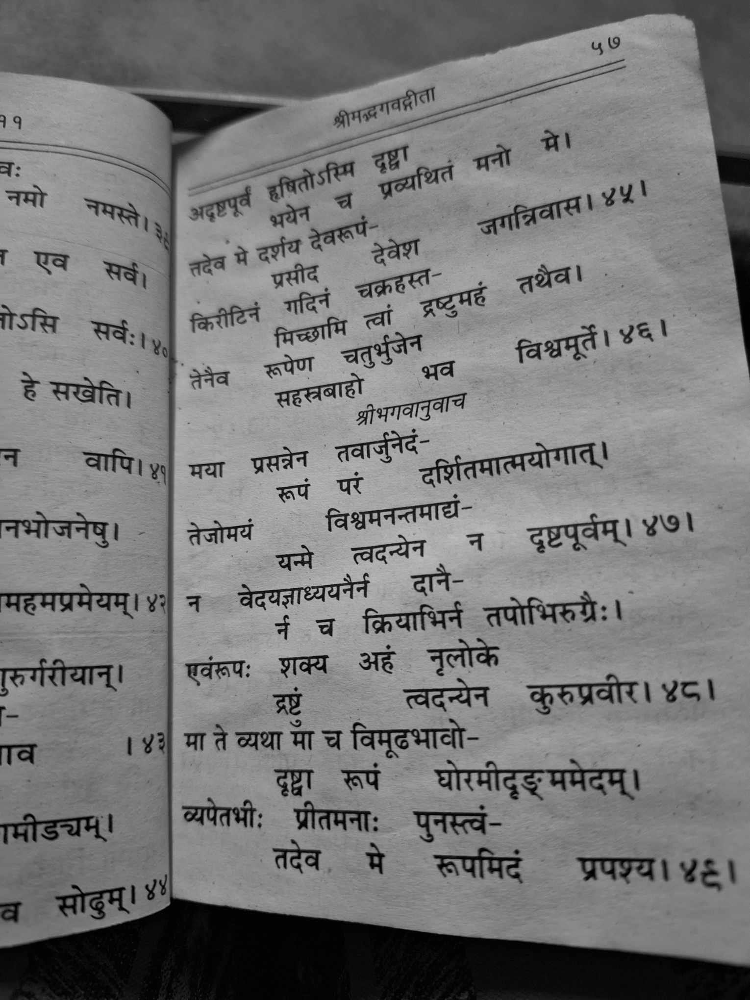

In [224]:
cv2_imshow(img)

**HISTOGRAM EQUALIZATION METHOD**

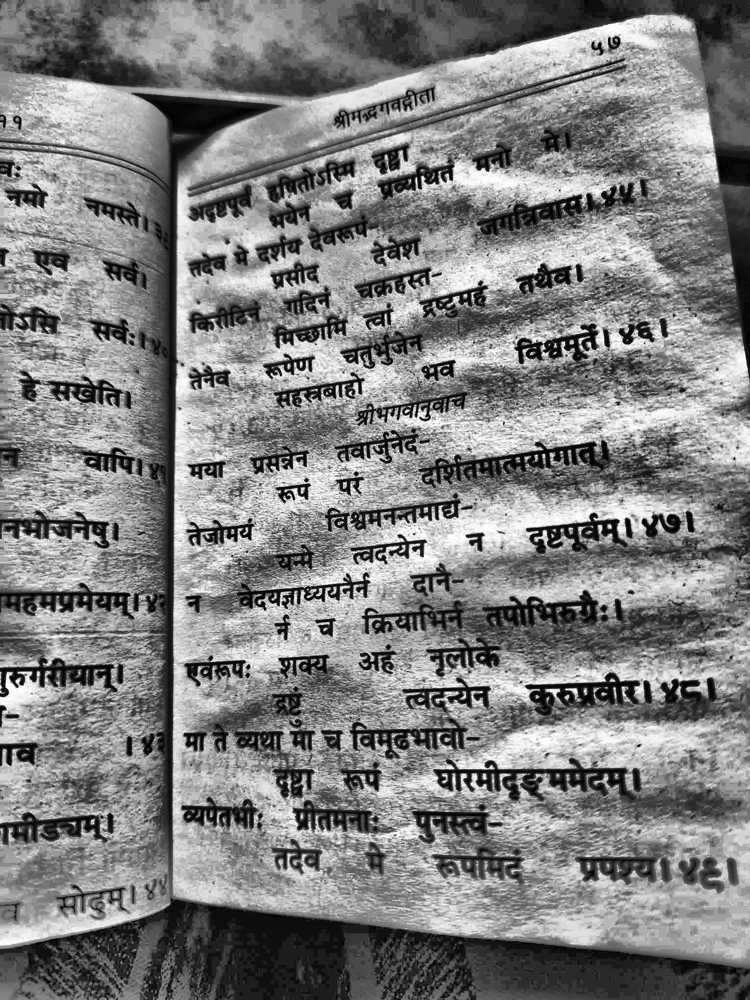

In [225]:
def histo(image):
  clahe = cv2.createCLAHE(clipLimit=11.0, tileGridSize=(8,8))
  clahe_image = clahe.apply(image)

  return (clahe_image)

clahe_image= histo(img)

cv2.imwrite('temp/clahe_image.jpg',clahe_image)
display(Image(filename='temp/clahe_image.jpg'))

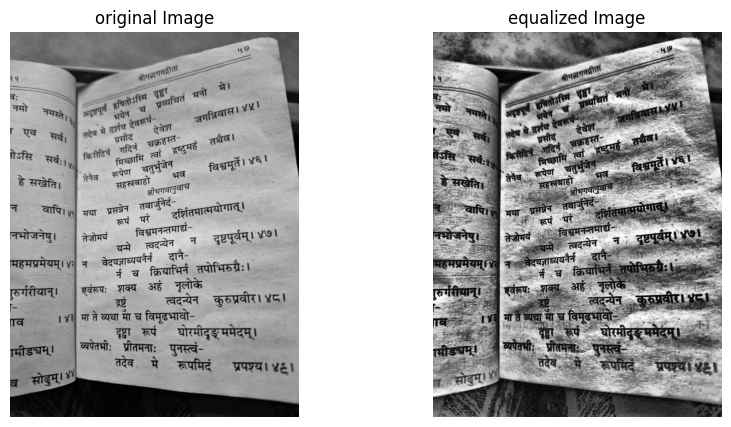

In [226]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(img, cmap="gray")
plt.title('original Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(clahe_image, cmap="gray")
plt.title('equalized Image')
plt.axis('off')
plt.show()

**GAMMA CORRECTION FOR ILLUMINATION ADJUSTMENT**

In [227]:
def adjust_gamma(image,gamma=0.7):
  invGamma= 1.0/gamma
  table= np.array([((i/255)**invGamma)*255 for i in np.arange(0,256)])
  gamma_corrected= cv2.LUT(img.astype(np.uint8),table.astype(np.uint8))
  return gamma_corrected

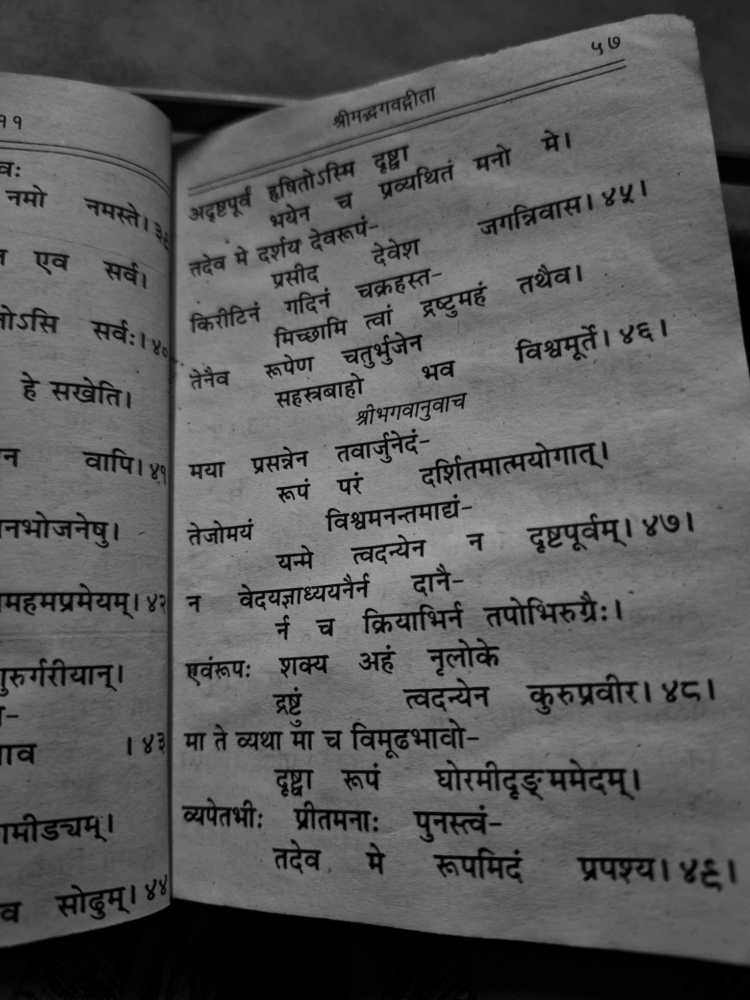

In [228]:
gamma_corrected= adjust_gamma(clahe_image)
cv2.imwrite('temp/gamma_corrected.jpg',gamma_corrected)
cv2_imshow(gamma_corrected)

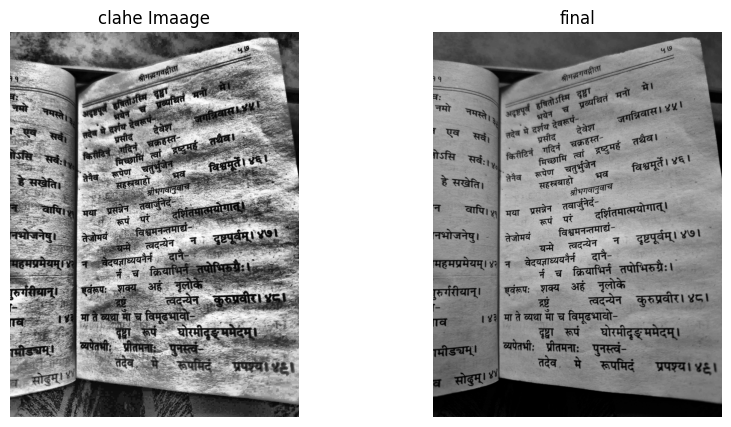

In [229]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(clahe_image, cmap="gray")
plt.title('clahe Imaage')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(gamma_corrected, cmap="gray")
plt.title('final')
plt.axis('off')
plt.show()

**ORIENTATION CORRECTION**

**DILATION BECAUSE OUR DATASET DOES WELL IN DILATION AND POOR IN EROSION**

In [230]:
def thick_font(image):
  image= cv2.bitwise_not(image)
  kernel= np.ones((3,3), np.uint8)
  image=cv2.dilate(image,kernel,iterations=1)
  image= cv2.bitwise_not(image)
  return(image)

In [231]:
dilated_image= thick_font(gamma_corrected)
cv2.imwrite('temp/dilated_image.jpg', dilated_image)

True

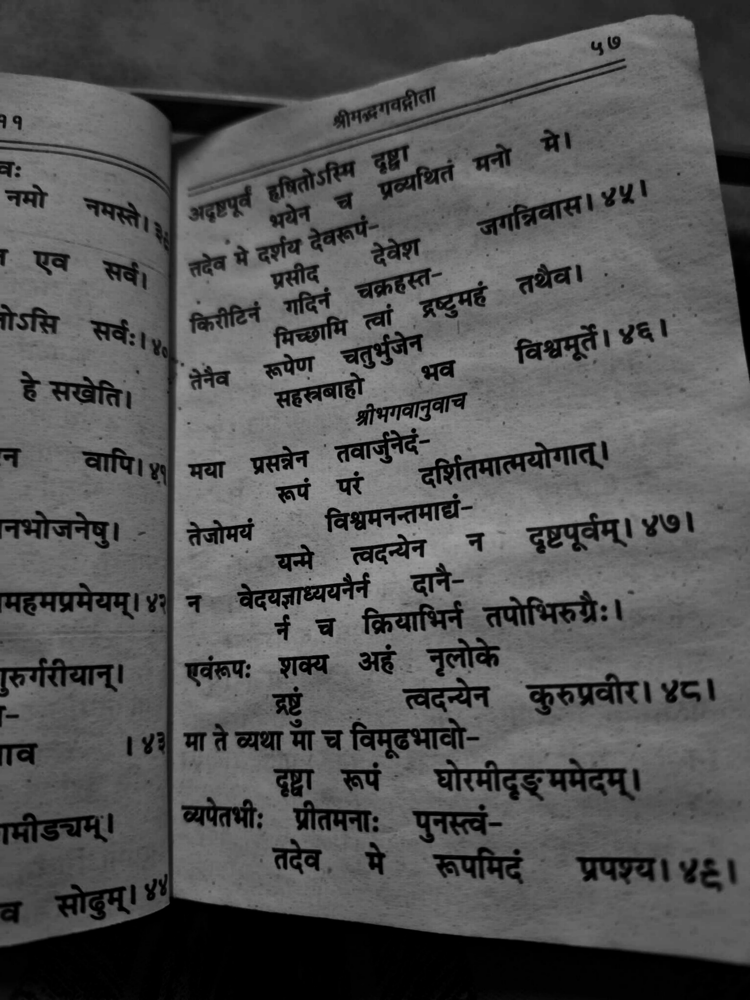

In [232]:
display(Image(filename= 'temp/dilated_image.jpg'))

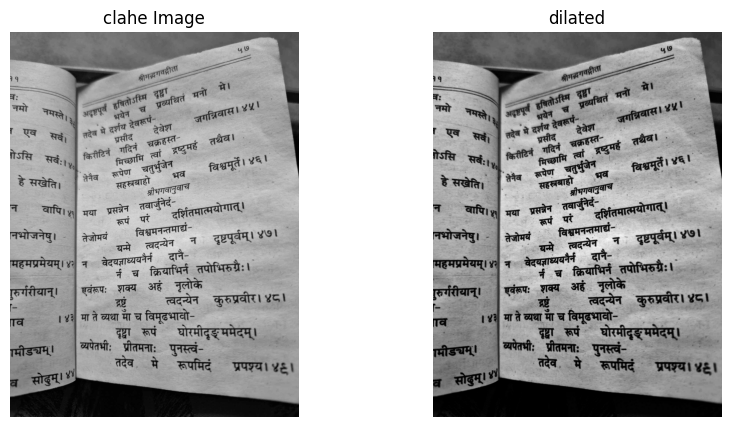

In [233]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(img, cmap="gray")
plt.title('clahe Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(dilated_image, cmap="gray")
plt.title('dilated')
plt.axis('off')
plt.show()

**NOISE REDUCTION**

In [234]:
def noise_removal(image):
  kernel= np.ones((1,1),np.uint8)
  image= cv2.dilate(image, kernel,iterations=1)
  kernel= np.ones((1,1),np.uint8)
  image= cv2.erode(image, kernel, iterations=1)
  image= cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
  image= cv2.medianBlur(image, 3)
  return(image)

In [235]:
no_noise= noise_removal(dilated_image)
cv2.imwrite('temp/no_noise.jpg',no_noise)

True

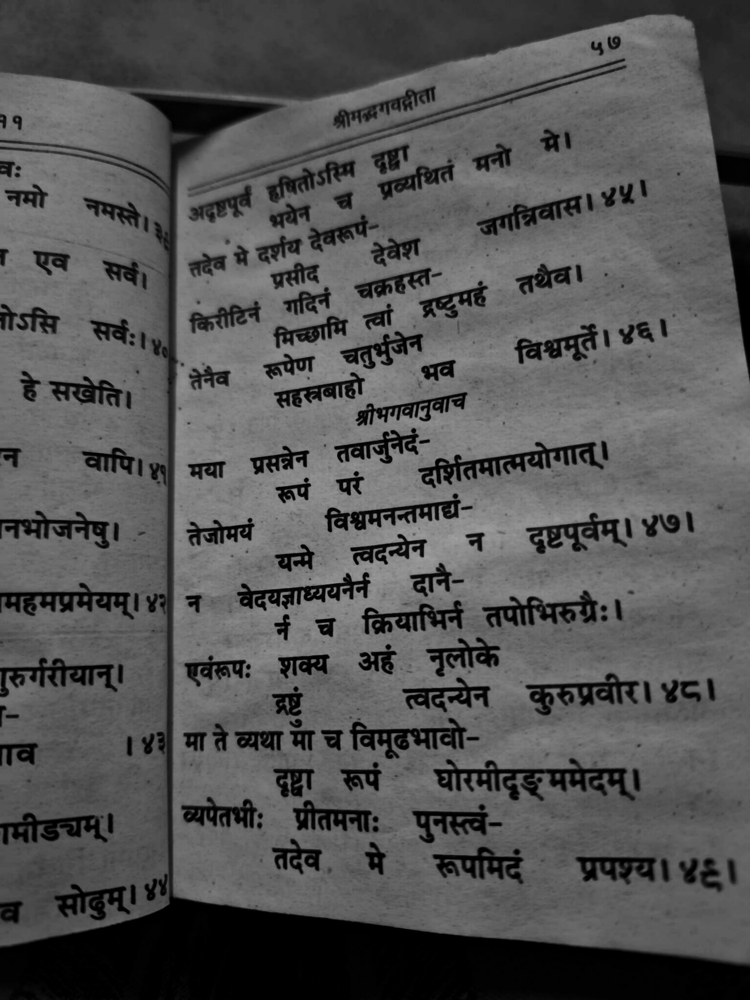

In [236]:
display(Image(filename='temp/no_noise.jpg'))

:**GAUSSIAN BLUR**

In [237]:
def blur(image):
  return cv2.GaussianBlur(image, (5,5),0)

blurred= blur(no_noise)#gamma corrected image is already in gray scale

cv2.imwrite('temp/g_blurred.jpg', blurred)#it isone of the noise reduction technique

True

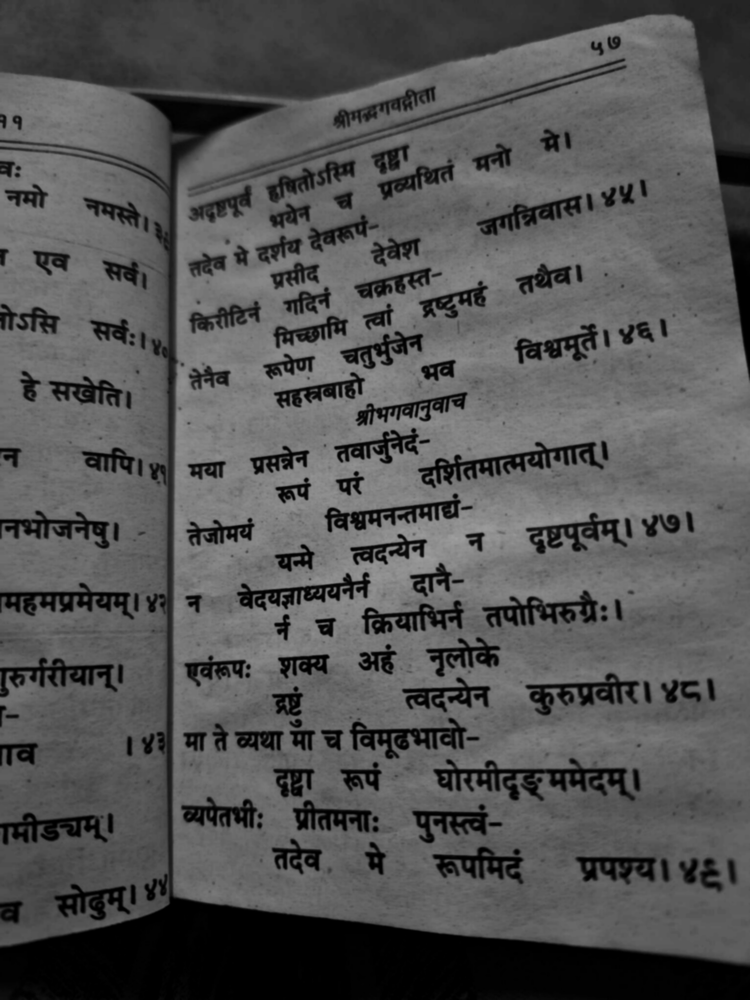

In [238]:
display(Image(filename='temp/g_blurred.jpg'))

**UNSHARP** **MASKING**

In [239]:
def sharp(image):
  f= image
  f= f/255
  f_blur= cv2.GaussianBlur(src=f,ksize=(5,5),sigmaX=0, sigmaY=0)

  g_mask= f - f_blur

  k=5
  g= f+ k*g_mask
  g= np.clip(g,0,1)
  g = (g * 255).astype(np.uint8)
  return g

In [240]:
sharpened_image= sharp(blurred)
cv2.imwrite('temp/sharpened_image.jpg',sharpened_image)

True

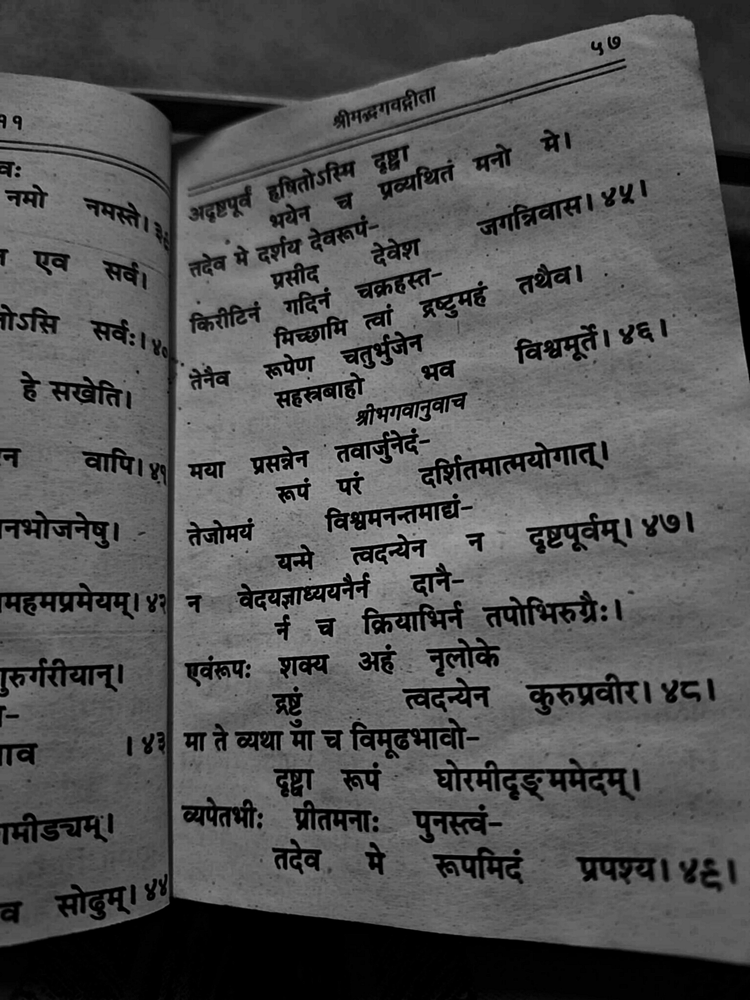

In [241]:
display(Image(filename='temp/sharpened_image.jpg'))

**RESOLUTION OPTIMIZATION:DPI ADJUSTMENTS**

In [242]:
def dpi(image):
  from PIL import Image
  pil_image = Image.fromarray(blurred)

# Adjust DPI to 300
  dpi = (300, 300)

  pil_image.save('temp/temporary_image_dpi.png', dpi=dpi)

# Open the saved image with DPI settings
  pil_image_with_dpi = Image.open('temp/temporary_image_dpi.png')

# Step 3: Convert PIL image back to cv2 image
  cv2_image_with_dpi = np.array(pil_image_with_dpi)
  return (cv2_image_with_dpi)

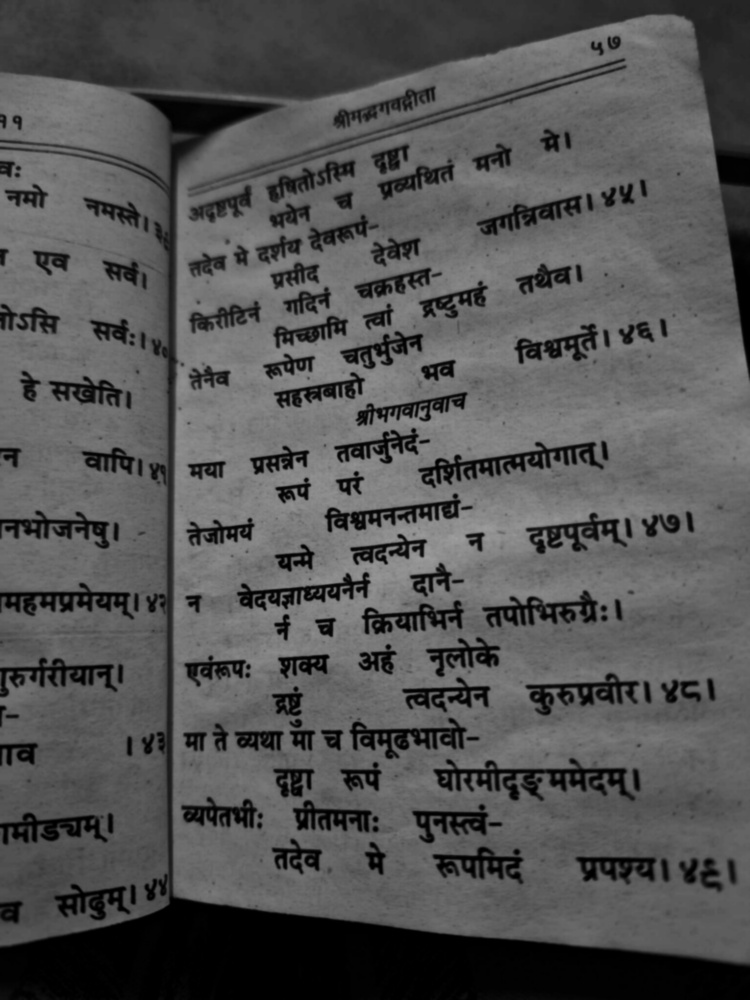

In [243]:
from IPython.display import display, Image
dpi_image= dpi(blurred)
cv2.imwrite('temp/dpi_image.png', dpi_image)
display(Image(filename='temp/dpi_image.png'))

**Tesseract**

In [244]:
!apt-get install tesseract-ocr
!apt-get install libtesseract-dev
!pip install pytesseract



import pytesseract
from PIL import Image
import os
import cv2
from pytesseract import Output
pytesseract.pytesseract.tesseract_cmd = r'/usr/bin/tesseract'
!wget -O /usr/share/tesseract-ocr/4.00/tessdata/san.traineddata https://github.com/tesseract-ocr/tessdata_best/raw/main/san.traineddata



Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (3,945 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 123595 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-

In [245]:
# Set the TESSDATA_PREFIX environment variable
os.environ['TESSDATA_PREFIX'] = '/usr/share/tesseract-ocr/4.00/tessdata'



def get_ocr_data(image_path):
    image = cv2.imread(image_path)
    config = '--oem 1 --psm 6'
    d = pytesseract.image_to_string(image, output_type=Output.DICT, lang='san', config=config)
    return d


image_path = f"/content/temp/sharpened_image.jpg"
ocr_data = get_ocr_data(image_path)
print(ocr_data['text'])

=

& १ भ

बः न

ट न ऽसि द्रा ~ अनो

नमो नमस्ते! अदू (४ | ॑ निवास । ४५।

` एव ` सद सदेव मे दथ ` देवेश.

प्रसीद, क्रहस्त- , तथैवा .

ऽसि सव., | किरीटिनं गदि तां दरष्टुम द.

इ निन = विमत ५६

न॒ चाधि।भ| मया प्रसेन ` तवार्जुन

नभोजनेषु। - | तेजोमयं श्रमनन्तमाद्यं
= = ध य =, न दृषूर्वम्‌। ४७ ।

महमप्रमेयम्‌। ४ वेदयन्नध्ययनैनं (2 <

- ५५. नं च क्रियाभिनं तपोभिरूगः।

रुू्गरीयान्‌। | एवंरूपः ` शक्व अहं नृलोके

- ः ऋ क त्वदन्येन कुरुप्रवीर \ ४८।

व ।४३मा तेव्यथामाच = |

० दष्टा रूपं ` घोरमीदृङ्ममेदम्‌

मीडचम्‌। व्यपेतभीः प्रीतमनाः | पुनस्त्वं ॥ त

तर सोद्म्‌। ४ तदेव, भे रूपमिदं प्रपश्य । ४६।

